<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [ ]:
import warnings
warnings.filterwarnings(action='ignore')

In [3]:
import os
import pandas as pd

import torchvision.transforms as tt
import torch
import torch.nn as nn
import numpy as np
import torch.optim as optim
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import save_image
from torchvision.utils import make_grid
from skimage.io import imread
from sklearn.manifold import TSNE
from sklearn.model_selection import LeaveOneOut, cross_val_score
from sklearn.neighbors import KNeighborsClassifier

%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [5]:
def seed_(seed=21):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_()

In [6]:
DATA_DIR = '/kaggle/input/faces-dataset/faces_dataset_small'

In [7]:
image_size = 64
batch_size = 32
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
epochs = 70
latent_size=128

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://www.kaggle.com/datasets/tommykamaz/faces-dataset-small?resource=download-directory) и  [здесь](https://drive.google.com/drive/folders/14H7LQWzd09SaM11oLfGtd455sWH2rmRW?usp=share_link)

In [8]:
transforms = tt.Compose([tt.ToTensor(),
    tt.Resize(image_size, antialias=True),
    tt.CenterCrop(image_size),
    tt.Normalize(*stats)])

In [9]:
class ImgDataset(Dataset):
    def __init__(self, directory=DATA_DIR, transformer=transforms):
        self.directory = directory
        self.imglist = os.listdir(path=directory)
        self.transformer = transformer
        
    def __len__(self):
        return len(self.imglist)
    
    def __getitem__(self, idx):
        item = self.imglist[idx]
        image = imread(f'{DATA_DIR}/{item}')
        return self.transformer(image)


In [10]:
data_loader = DataLoader(ImgDataset(),
                         batch_size=batch_size,
                        shuffle=True)

In [11]:
X_batch = next(iter(data_loader))
X_batch.shape

torch.Size([32, 3, 64, 64])

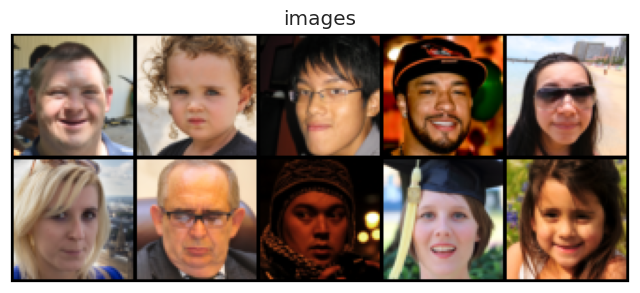

In [12]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=10, nrow=5, title='images'):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(title)
    ax.imshow(make_grid(denorm(images.cpu().detach()[:nmax]), nrow=nrow).permute(1, 2, 0))
    
def show_batch(dl, nmax=10):
    for images in dl:
        show_images(images, nmax)
        break
        
show_batch(data_loader)

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [13]:
Discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [14]:
Generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

In [15]:
gen = Generator.to(device)
disc = Discriminator.to(device)

model = {
    "generator": gen,
    "discriminator": disc
}

opt_g = optim.Adam(model['generator'].parameters(),lr=0.0002, betas=(0.5, 0.999))
opt_d = optim.Adam(model['discriminator'].parameters(), lr=0.00002, betas=(0.5, 0.999))


optimizer = {
    "generator": opt_g,
    "discriminator": opt_d
}

criterion = {
    "generator": nn.BCELoss(),
    "discriminator": nn.BCELoss()
}

In [16]:
#проверим, что всё правильно генерируется и дискриминируется
latent = torch.randn(2, latent_size, 1, 1, device=device)
y = model["generator"](latent)
y.shape

torch.Size([2, 3, 64, 64])

In [17]:
model["discriminator"](y).shape

torch.Size([2, 1])

In [18]:
def fit_epoch(models, train_loader, criterions, optimizers, device=DEVICE):
    models['discriminator'].to(device)
    models['generator'].to(device)
    loss_d_per_epoch = []
    loss_g_per_epoch = []
    real_score_per_epoch = []
    fake_score_per_epoch = []
    mean_preds_per_epoch = []
    models['discriminator'].train()
    models['generator'].train()
    for real_images in train_loader:
        real_images = real_images.to(device).to(torch.float32)
        
        #models['discriminator'].train()
        #models['generator'].eval()
        
        optimizers["generator"].zero_grad()
        optimizers["discriminator"].zero_grad()
        
        real_preds = models["discriminator"](real_images)
        real_targets = torch.ones(real_images.size(0), 1, device=device)
        real_loss = criterions["discriminator"](real_preds, real_targets)
        cur_real_score = torch.mean(real_preds).item()
        
        latent = torch.randn(batch_size, latent_size, 1, 1, device=device)

        fake_images = models["generator"](latent).detach()
    
        fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
        fake_preds = models["discriminator"](fake_images)
        fake_loss = criterions["discriminator"](fake_preds, fake_targets)
        cur_fake_score = torch.mean(fake_preds).item()
        
        real_score_per_epoch.append(cur_real_score)
        fake_score_per_epoch.append(cur_fake_score)
        
        # обновляем веса дискриминатора
        loss_d = real_loss + fake_loss
        loss_d.backward()
        optimizers["discriminator"].step()
        loss_d_per_epoch.append(loss_d.item())
        
        #теперь обучаем генератор
        #models['generator'].train()
        #models['discriminator'].eval()
        
        optimizers["generator"].zero_grad()
        optimizers["discriminator"].zero_grad()
        
        latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
        fake_images = models["generator"](latent)
        
        preds = models["discriminator"](fake_images)
        mean_pred = torch.mean(preds).item()
        targets = torch.ones(batch_size, 1, device=device)
        loss_g = criterions["generator"](preds, targets)
        loss_g.backward()
        
        optimizers["generator"].step()
        mean_preds_per_epoch.append(mean_pred)
        loss_g_per_epoch.append(loss_g.item())
        
    return (np.mean(np.array(loss_d_per_epoch)),
            np.mean(np.array(loss_g_per_epoch)),
            np.mean(np.array(real_score_per_epoch)), 
            np.mean(np.array(fake_score_per_epoch)), 
            np.mean(np.array(mean_preds_per_epoch)))

In [19]:
def train(models, optimizers, criterions, epochs, train_loader, device=DEVICE):
    history = []
    fake_images = []
    torch.cuda.empty_cache()
    for epoch in tqdm(range(epochs)):
        print(f'Epoch {epoch+1}/{epochs}')
        loss_d_per_epoch, loss_g_per_epoch, real_score_per_epoch, fake_score_per_epoch, mean_preds_per_epoch = fit_epoch(models,
                                                                                                   train_loader,
                                                                                                   criterions,
                                                                                                   optimizers,
                                                                                                   device)
        print(f"Лосс дискриминатора равен {loss_d_per_epoch}, лосс генератора равен {loss_g_per_epoch}")
        print(f'Метрика дискриминатора на настоящих картинках {real_score_per_epoch}, на сгенерированных {fake_score_per_epoch}')
        history.append((loss_d_per_epoch, loss_g_per_epoch, real_score_per_epoch, fake_score_per_epoch, mean_preds_per_epoch))
        
        #models['generator'].eval()
        ltn = torch.randn(4, latent_size, 1, 1, device=device)
        fake_image = models["generator"](ltn)
        fake_images.append(fake_image.cpu().detach())
        
    return history, fake_images

In [20]:
history, fake_images = train(models = model,
                optimizers = optimizer,
                criterions = criterion,
                epochs = epochs,
                train_loader = data_loader)

  0%|          | 0/70 [00:00<?, ?it/s]

Epoch 1/70
Лосс дискриминатора равен 2.848869688583143, лосс генератора равен 0.5337227256310106
Метрика дискриминатора на настоящих картинках 0.5311753000273849, на сгенерированных 0.8685410829505535
Epoch 2/70
Лосс дискриминатора равен 3.3975546986165672, лосс генератора равен 0.5611166102115555
Метрика дискриминатора на настоящих картинках 0.2875710814589202, на сгенерированных 0.8399373569873848
Epoch 3/70
Лосс дискриминатора равен 2.5643132479503903, лосс генератора равен 0.8281158407529196
Метрика дискриминатора на настоящих картинках 0.3364692107595579, на сгенерированных 0.7066257565912574
Epoch 4/70
Лосс дискриминатора равен 2.151564228414285, лосс генератора равен 0.9510472477084458
Метрика дискриминатора на настоящих картинках 0.38317335494840987, на сгенерированных 0.6146400296928907
Epoch 5/70
Лосс дискриминатора равен 1.7507020427723123, лосс генератора равен 1.091713425486979
Метрика дискриминатора на настоящих картинках 0.4434473854724807, на сгенерированных 0.519605062

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

In [21]:
loss_d, loss_g, real_score, fake_score, mean_preds_per_epoch = zip(*history)

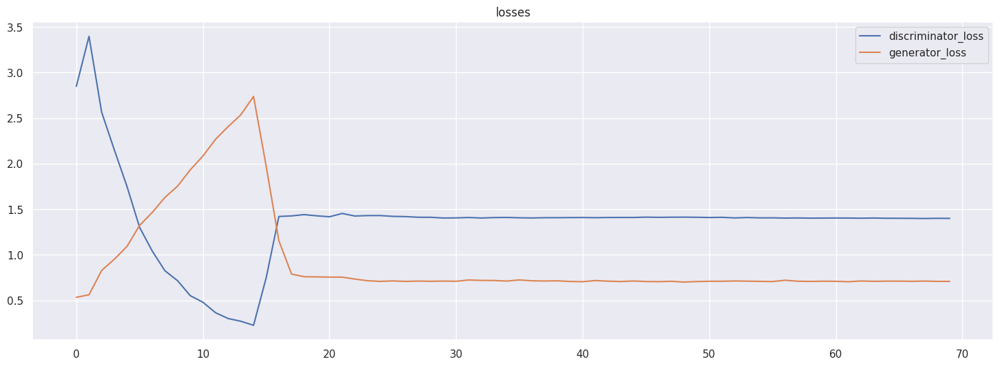

In [22]:
sns.set(rc={'figure.figsize':(18, 6)})

fig, axs = plt.subplots()
axs.set(title='losses')
axs.plot(loss_d, label='discriminator_loss')
axs.plot(loss_g, label='generator_loss')
axs.legend()
plt.show()

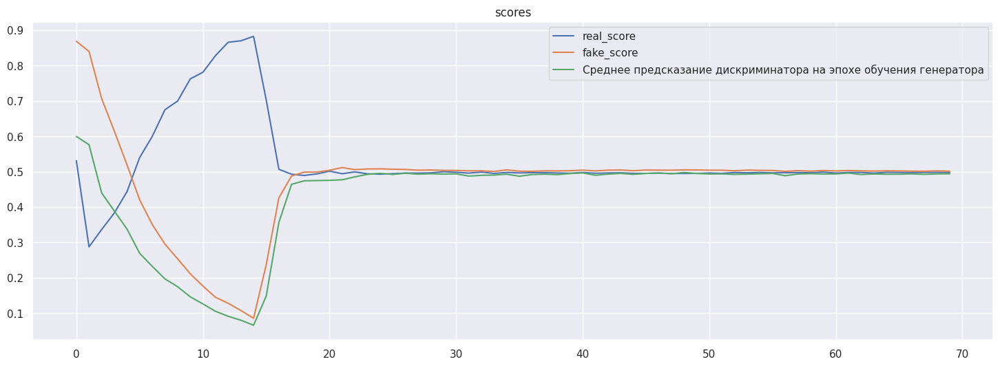

In [23]:
fig, axs = plt.subplots()
axs.set(title='scores')
axs.plot(real_score, label='real_score')
axs.plot(fake_score, label='fake_score')
axs.plot(mean_preds_per_epoch, label='Среднее предсказание дискриминатора на эпохе обучения генератора')
axs.legend()
plt.show()

## Часть 3. Генерация изображений (1 балл)

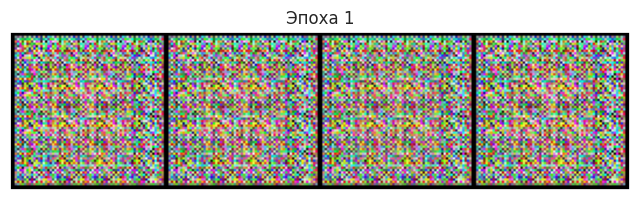

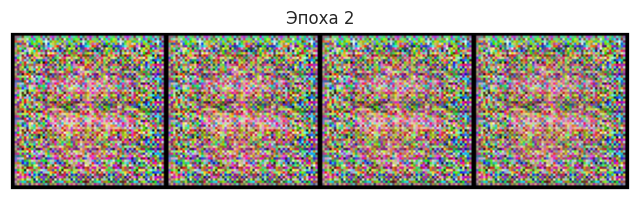

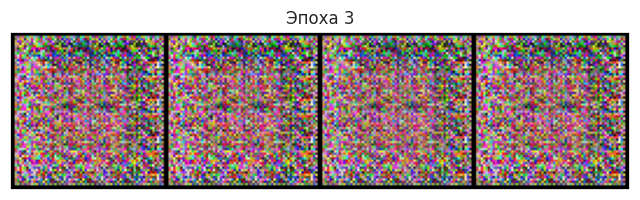

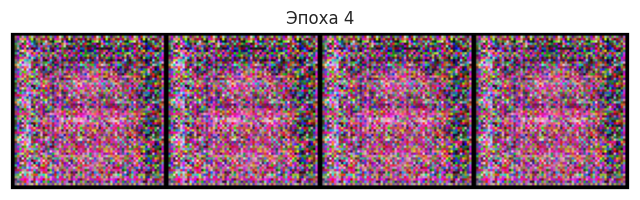

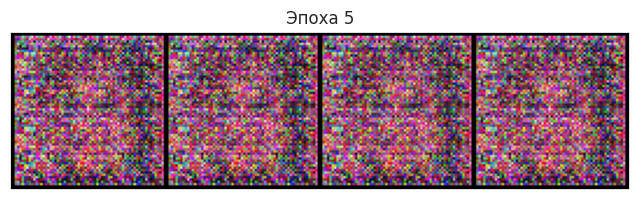

...

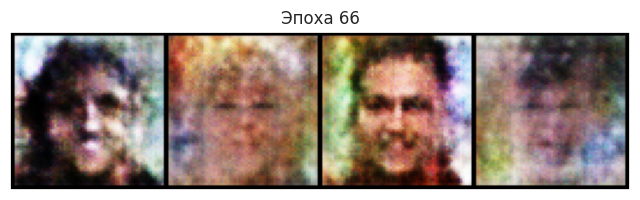

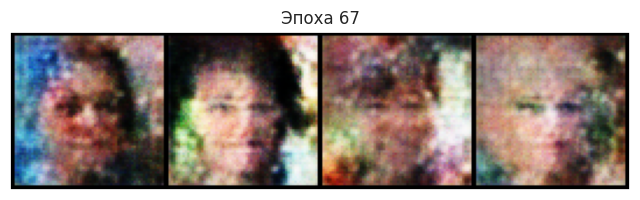

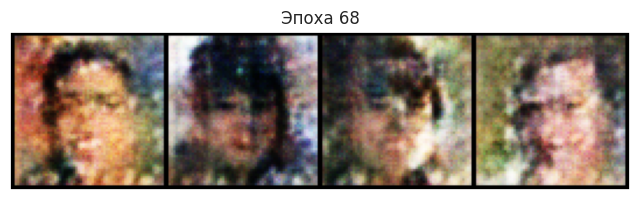

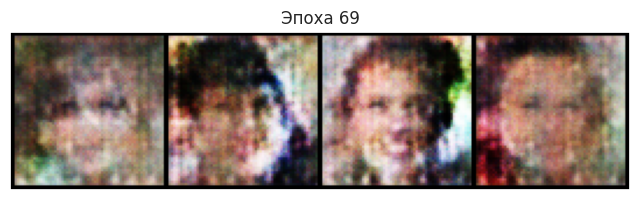

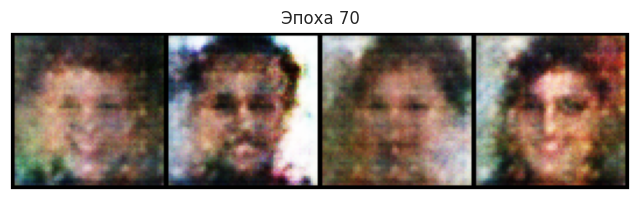

In [24]:
i = 0
for image in fake_images:
    i += 1
    show_images(image, title=f"Эпоха {i}")

In [25]:
latent = torch.randn(4, latent_size, 1, 1, device=device)

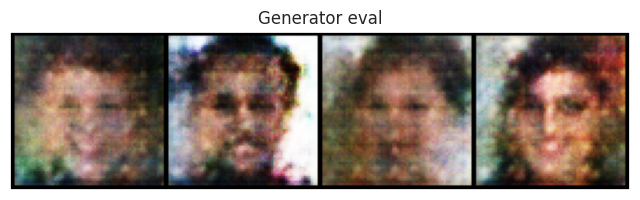

In [26]:
model["generator"].eval()
fake_images = model["generator"](latent).cpu().detach()
show_images(image, title="Generator eval")

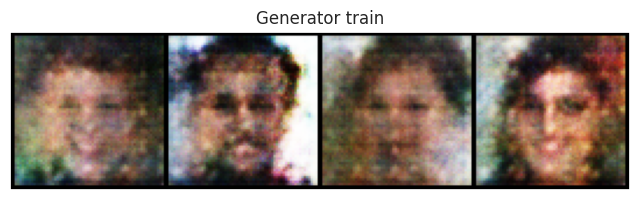

In [27]:
model["generator"].train()
fake_images = model["generator"](latent).cpu().detach()
show_images(image, title="Generator train")

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображениям

In [28]:
model["generator"].eval()
lst = []
for X in tqdm(ImgDataset()):
    X = X.to('cpu').detach().numpy().flatten()
    row = np.append([1], X)
    lst.append(row)
    latent = torch.randn(1, latent_size, 1, 1, device=device)
    Y = model["generator"](latent).to('cpu').detach().numpy().flatten()
    row = np.append([0], Y)
    lst.append(row)

  0%|          | 0/3143 [00:00<?, ?it/s]

In [29]:
df = pd.DataFrame(lst).rename(columns={0:'label'})
df['label'] = df['label'].astype(int)

In [30]:
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,label,1,2,3,4,5,6,7,8,9,...,12279,12280,12281,12282,12283,12284,12285,12286,12287,12288
0,0,-0.421447,-0.626512,-0.559561,-0.535477,-0.432965,-0.567209,-0.475906,-0.582088,-0.571815,...,-0.730180,-0.546409,-0.630576,-0.696821,-0.742794,-0.640819,-0.678891,-0.574513,-0.599740,-0.329739
1,1,-0.898014,-0.898616,-0.884044,-0.863257,-0.862249,-0.874353,-0.871180,-0.863321,-0.849064,...,0.799948,0.787030,0.775478,0.784702,0.670402,0.507694,0.327762,0.272476,0.315840,0.305813
2,1,-0.448234,-0.426046,-0.424517,-0.447868,-0.445678,-0.437010,-0.449302,-0.433694,-0.363505,...,-0.563772,-0.522593,-0.518821,-0.580051,-0.515617,-0.442345,-0.460295,-0.468909,-0.463916,-0.474897
3,0,-0.456353,-0.674130,-0.594495,-0.637051,-0.499351,-0.689930,-0.550854,-0.601199,-0.423832,...,-0.028839,0.241776,0.159226,0.134711,-0.112897,-0.131844,-0.161784,-0.029824,-0.179331,-0.013682
4,0,-0.048932,-0.119571,-0.071395,-0.119376,-0.070533,-0.065668,-0.004899,-0.138959,-0.166472,...,-0.634837,-0.400305,-0.415339,-0.472724,-0.566302,-0.462631,-0.530045,-0.400141,-0.382485,-0.128098


In [31]:
tsne = TSNE(n_components=2, random_state=42)

x_transformed = tsne.fit_transform(df.drop(columns = 'label'))

tsne_df = pd.DataFrame(np.column_stack((x_transformed, df['label'])), columns=['X', 'Y', "Targets"])

OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

<Figure size 1000x800 with 0 Axes>

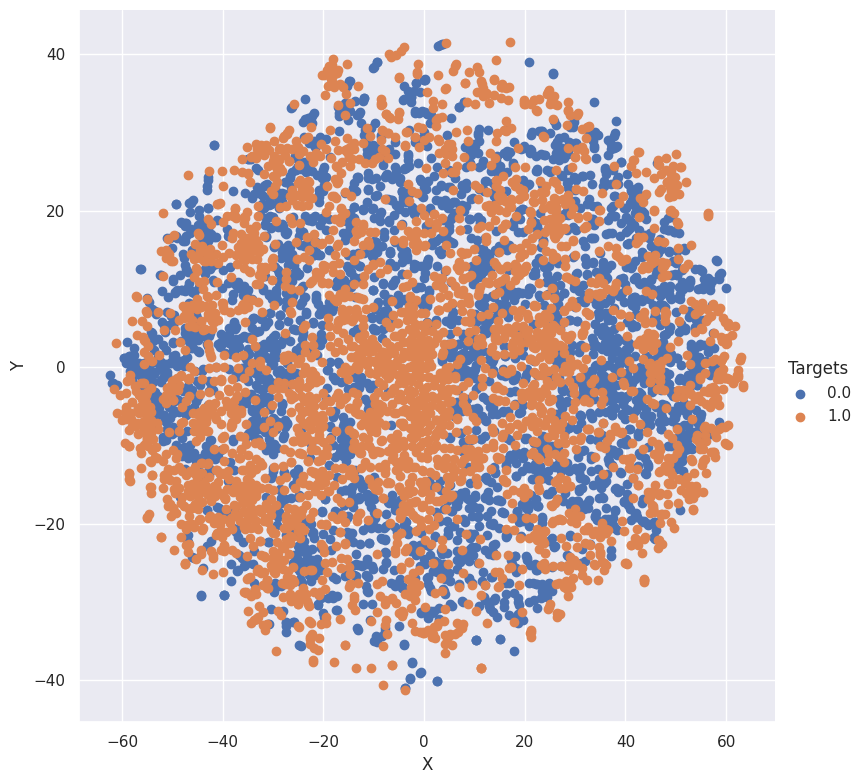

In [32]:
plt.figure(figsize=(10,8))

g = sns.FacetGrid(data=tsne_df, hue='Targets', height=8)

g.map(plt.scatter, 'X', 'Y').add_legend()

plt.show()

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

Вычисления такого размера не потянет ни один адекватный процессор, поэтому поступим так: засемплируем несколько кусочков исходного датасета (например, размера 100) и подадим в leaveoneout.

In [ ]:
md = KNeighborsClassifier(n_neighbors=1)
cv = LeaveOneOut()

In [34]:
lst = []

for i in tqdm(range(1,21)):
    df_sample = df.sample(100, random_state=i)
    X = df_sample.drop(columns='label')
    y = df_sample['label']
    
    scores = cross_val_score(md,
                         X, y,
                         scoring='accuracy',
                         cv=cv, n_jobs=-1)
    
    lst.append(scores.mean())

  0%|          | 0/20 [00:00<?, ?it/s]

In [35]:
lst

[0.69,
 0.73,
 0.77,
 0.7,
 0.66,
 0.72,
 0.75,
 0.62,
 0.71,
 0.7,
 0.67,
 0.67,
 0.69,
 0.62,
 0.7,
 0.75,
 0.64,
 0.59,
 0.6,
 0.71]

In [36]:
np.mean(np.array(lst))

0.6845000000000001